# Pregunta 3 - Detección de Cumplimiento de Normas de Seguridad en Obras de Construcción mediante YOLOv8

## Objetivo

Desarrollar un sistema de detección automática de trabajadores que cumplen o incumplen el uso de casco de seguridad utilizando YOLOv8. El sistema permitirá identificar trabajadores con casco y sin casco, además de calcular una tasa de cumplimiento mediante un verificador basado en reglas.

**Instalación de dependencias**

In [1]:
!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.2/249.2 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 33.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.15
    Uninstalling idna-3.15:
      Successfully uninstalled idna-3.15


## Descarga del conjunto de datos

Se utiliza el dataset **Safety Helmet Computer Vision Dataset** obtenido desde Roboflow Universe. El conjunto contiene imágenes etiquetadas con las clases:

- Helmet
- No Helmet

Las imágenes fueron divididas en conjuntos de entrenamiento, validación y prueba.

**Descarga del dataset desde Roboflow**

In [2]:
# @title
from roboflow import Roboflow

rf = Roboflow(api_key="Hqbjh55xMTziUN1MjqWo")
project = rf.workspace("codaerus").project("safety-helmet-tsqdw-i3mwq")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Safety-Helmet-1 in yolov8:: 100%|██████████| 4247/4247 [00:02<00:00, 2063.18it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Verificación del entorno de ejecución

Se verifica la disponibilidad de GPU para acelerar el entrenamiento del modelo YOLOv8.

**Verificación de GPU**

In [3]:
# @title
import torch

print("GPU disponible:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

GPU disponible: True
GPU: Tesla T4


## Exploración inicial del dataset

Se inspecciona la estructura de directorios generada por Roboflow para verificar la correcta descarga del conjunto de datos.

**Verificación de archivos descargados**

In [4]:
import os

print(os.listdir())

['.config', 'Safety-Helmet-1', 'sample_data']


## Estructura del conjunto de datos

Los conjuntos de datos exportados en formato YOLO contienen imágenes y anotaciones separadas en subconjuntos de entrenamiento, validación y prueba. A continuación se inspecciona la estructura de directorios generada por Roboflow.

In [5]:
import os

dataset_folder = "Safety-Helmet-1"

for root, dirs, files in os.walk(dataset_folder):
    print(root)

Safety-Helmet-1
Safety-Helmet-1/valid
Safety-Helmet-1/valid/images
Safety-Helmet-1/valid/labels
Safety-Helmet-1/test
Safety-Helmet-1/test/images
Safety-Helmet-1/test/labels
Safety-Helmet-1/train
Safety-Helmet-1/train/images
Safety-Helmet-1/train/labels


## Identificación de clases

Las clases utilizadas por el modelo se encuentran definidas en el archivo `data.yaml`. Esta configuración será empleada posteriormente durante el entrenamiento y evaluación del detector YOLOv8.

In [6]:
import yaml
import os

yaml_path = os.path.join("Safety-Helmet-1", "data.yaml")

with open(yaml_path, "r") as f:
    data_config = yaml.safe_load(f)

print("Contenido del archivo data.yaml:\n")
print(data_config)

print("\nClases detectadas:")

for i, clase in enumerate(data_config["names"]):
    print(f"Clase {i}: {clase}")

Contenido del archivo data.yaml:

{'names': ['Helmet', 'No Helmet'], 'nc': 2, 'roboflow': {'license': 'CC BY 4.0', 'project': 'safety-helmet-tsqdw-i3mwq', 'url': 'https://universe.roboflow.com/codaerus/safety-helmet-tsqdw-i3mwq/dataset/1', 'version': 1, 'workspace': 'codaerus'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}

Clases detectadas:
Clase 0: Helmet
Clase 1: No Helmet


**Visualización de Muestras del Dataset**

## Visualización de muestras del conjunto de entrenamiento

Se visualizan ejemplos representativos del conjunto de entrenamiento con el objetivo de inspeccionar la diversidad de escenarios, condiciones de iluminación y tamaño de los objetos presentes en las imágenes.

Esta exploración permite identificar posibles desafíos para el modelo, tales como oclusiones parciales, variaciones de escala y fondos complejos.

**Visualización de imágenes del conjunto de entrenamiento**

In [7]:
import os
import cv2
import random
import matplotlib.pyplot as plt

ruta_imagenes = "Safety-Helmet-1/train/images"

imagenes = random.sample(os.listdir(ruta_imagenes), 6)

plt.figure(figsize=(15,10))

for i, archivo in enumerate(imagenes):

    ruta = os.path.join(ruta_imagenes, archivo)

    imagen = cv2.imread(ruta)
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(imagen)
    plt.title(archivo)
    plt.axis("off")

plt.tight_layout()
plt.show()

**Distribución de clases del conjunto de entrenamiento**

Se analiza la cantidad de anotaciones presentes para cada clase del conjunto de entrenamiento con el objetivo de identificar posibles problemas de desbalance.

La distribución de clases es un factor importante debido a que una representación desigual puede influir en la capacidad del modelo para detectar correctamente las categorías menos frecuentes.

In [ ]:
from collections import Counter
import os

ruta_labels = "Safety-Helmet-1/train/labels"

contador = Counter()

for archivo in os.listdir(ruta_labels):

    with open(os.path.join(ruta_labels, archivo), "r") as f:

        for linea in f:

            clase = int(linea.split()[0])
            contador[clase] += 1

print("Distribución de clases:\n")

for clase, cantidad in contador.items():
    print(f"{data_config['names'][clase]}: {cantidad}")

### Observaciones

La distribución de clases muestra que la categoría **Helmet** posee 2393 anotaciones, mientras que la categoría **No Helmet** registra 841 anotaciones.

Esto evidencia un desbalance moderado en el conjunto de entrenamiento, donde los ejemplos de uso correcto del casco son aproximadamente tres veces más numerosos que los casos de incumplimiento.

Este comportamiento es consistente con escenarios reales de seguridad laboral, donde las situaciones de incumplimiento suelen ser menos frecuentes. Sin embargo, dicho desbalance puede influir en la capacidad del modelo para detectar correctamente la clase minoritaria, por lo que será necesario interpretar cuidadosamente las métricas obtenidas durante la evaluación.

**Verificación visual de anotaciones**

Se visualiza una imagen del conjunto de entrenamiento junto con sus anotaciones para comprobar que las cajas delimitadoras se encuentran correctamente posicionadas sobre los objetos de interés.

Esta validación permite verificar la calidad de las etiquetas antes de iniciar el entrenamiento del modelo.

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

ruta_imagenes = "Safety-Helmet-1/train/images"
ruta_labels = "Safety-Helmet-1/train/labels"

archivo = random.choice(os.listdir(ruta_imagenes))

ruta_img = os.path.join(ruta_imagenes, archivo)
ruta_lbl = os.path.join(
    ruta_labels,
    archivo.rsplit(".", 1)[0] + ".txt"
)

img = cv2.imread(ruta_img)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w, _ = img.shape

with open(ruta_lbl, "r") as f:

    for linea in f:

        clase, x, y, bw, bh = map(float, linea.split())

        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)

        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cv2.rectangle(
            img,
            (x1, y1),
            (x2, y2),
            (255, 0, 0),
            2
        )

        nombre_clase = data_config["names"][int(clase)]

        cv2.putText(
            img,
            nombre_clase,
            (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (255,0,0),
            2
        )

plt.figure(figsize=(8,8))
plt.imshow(img)
plt.axis("off")
plt.show()

### Observaciones

Se verificó visualmente una muestra del conjunto de entrenamiento junto con sus anotaciones.

Las cajas delimitadoras se encuentran correctamente ubicadas sobre los cascos de seguridad y las etiquetas asociadas corresponden a la clase "Helmet".

Esta inspección preliminar permite concluir que las anotaciones presentan una calidad adecuada para iniciar el proceso de entrenamiento del detector YOLOv8.

**Análisis de dimensiones de las imágenes**

Se analiza la resolución de las imágenes del conjunto de entrenamiento para identificar la variabilidad existente en el dataset.

Esta información permitirá seleccionar una resolución de entrada apropiada para el entrenamiento del modelo YOLOv8.

In [ ]:
import os
import cv2
import pandas as pd

ruta_imagenes = "Safety-Helmet-1/train/images"

anchos = []
altos = []

for archivo in os.listdir(ruta_imagenes):

    ruta = os.path.join(ruta_imagenes, archivo)

    img = cv2.imread(ruta)

    if img is not None:

        alto, ancho = img.shape[:2]

        anchos.append(ancho)
        altos.append(alto)

df_dimensiones = pd.DataFrame({
    "Ancho": anchos,
    "Alto": altos
})

print("Número de imágenes analizadas:", len(df_dimensiones))

print("\nResumen estadístico:")
print(df_dimensiones.describe())

### Observaciones

Se analizaron 1746 imágenes del conjunto de entrenamiento.

La resolución promedio observada fue de aproximadamente 726 × 672 píxeles. Sin embargo, se identificó que el 50% de las imágenes poseen una resolución de 640 × 640 píxeles, mientras que algunas alcanzan hasta 2048 × 2048 píxeles.

Dado que la mayoría de las imágenes se concentran alrededor de 640 × 640 píxeles, se considera adecuada una resolución de entrada de 640 × 640 para el entrenamiento de YOLOv8, permitiendo conservar suficiente detalle visual sin incrementar excesivamente el costo computacional.

**Análisis del tamaño de los objetos anotados**

Se estudia el tamaño de las cajas delimitadoras presentes en las anotaciones para estimar la escala de los objetos que el modelo deberá detectar.

Este análisis permite identificar si predominan objetos grandes, medianos o pequeños dentro de las imágenes del conjunto de entrenamiento.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

ruta_labels = "Safety-Helmet-1/train/labels"
ruta_imagenes = "Safety-Helmet-1/train/images"

areas = []

for archivo in os.listdir(ruta_labels):

    if not archivo.endswith(".txt"):
        continue

    nombre_imagen = archivo.replace(".txt", ".jpg")

    ruta_img = os.path.join(ruta_imagenes, nombre_imagen)

    if not os.path.exists(ruta_img):

        nombre_imagen = archivo.replace(".txt", ".png")
        ruta_img = os.path.join(ruta_imagenes, nombre_imagen)

    if not os.path.exists(ruta_img):
        continue

    img = cv2.imread(ruta_img)

    if img is None:
        continue

    h, w = img.shape[:2]

    with open(os.path.join(ruta_labels, archivo)) as f:

        for linea in f:

            datos = linea.strip().split()

            if len(datos) != 5:
                continue

            _, xc, yc, bw, bh = map(float, datos)

            area = (bw * w) * (bh * h)

            areas.append(area)

plt.figure(figsize=(8,5))

plt.hist(areas, bins=30)

plt.title("Distribución del tamaño de las cajas")
plt.xlabel("Área de la caja (pixeles²)")
plt.ylabel("Frecuencia")

plt.show()

print("Cantidad total de objetos:", len(areas))
print("Área promedio:", np.mean(areas))
print("Área mínima:", np.min(areas))
print("Área máxima:", np.max(areas))

**Análisis del tamaño de los objetos anotados**

Se analizó el tamaño de las cajas delimitadoras presentes en las anotaciones del conjunto de entrenamiento.

Este estudio permite conocer la escala de los objetos que el detector deberá reconocer y ayuda a justificar decisiones posteriores relacionadas con la resolución de entrada del modelo YOLOv8.

### Observaciones

Se identificaron 3234 objetos anotados dentro del conjunto de entrenamiento.

La distribución observada indica que la mayoría de los objetos poseen tamaños pequeños o medianos, aunque también existen algunos ejemplos de gran tamaño.

Debido a esta variabilidad de escalas, se considera apropiado utilizar una resolución de entrada de 640 × 640 píxeles durante el entrenamiento, ya que ofrece un equilibrio adecuado entre precisión de detección y costo computacional.

**Distribución de imágenes por clase**

Se calcula la cantidad de anotaciones correspondientes a cada clase con el fin de identificar posibles desbalances en la distribución de los datos.

Este análisis resulta importante debido a que una distribución desigual puede afectar el comportamiento del modelo durante el entrenamiento.

In [ ]:
from collections import defaultdict
import os

ruta_labels = "Safety-Helmet-1/train/labels"

conteo = defaultdict(int)

for archivo in os.listdir(ruta_labels):

    if not archivo.endswith(".txt"):
        continue

    with open(os.path.join(ruta_labels, archivo), "r") as f:

        for linea in f:

            clase = int(linea.split()[0])

            conteo[clase] += 1

print("Distribución de clases\n")

for clase, cantidad in conteo.items():

    print(f"{data_config['names'][clase]}: {cantidad}")

In [ ]:
import matplotlib.pyplot as plt

clases = [data_config["names"][k] for k in conteo.keys()]
cantidades = list(conteo.values())

plt.figure(figsize=(6,4))

plt.bar(clases, cantidades)

plt.title("Distribución de clases")
plt.ylabel("Cantidad de anotaciones")

plt.show()

### Observaciones

La distribución de clases presenta un desbalance moderado.

La clase Helmet concentra aproximadamente el 74% de las anotaciones, mientras que la clase No Helmet representa alrededor del 26%.

Este comportamiento podría inducir al modelo a favorecer la detección de trabajadores con casco, por lo que será importante analizar posteriormente las métricas individuales por clase para verificar que el rendimiento no se degrade significativamente sobre la clase minoritaria.

# Entrenamiento del modelo YOLOv8

En esta sección se configura y entrena un detector de objetos basado en la arquitectura YOLOv8.

Las decisiones de entrenamiento se documentan con el fin de justificar la configuración utilizada y analizar posteriormente su impacto sobre el desempeño del modelo.

**Configuración del entrenamiento**

Se selecciona YOLOv8n (Nano) debido a su bajo costo computacional y su capacidad para realizar detección de objetos en tiempo real.

Las decisiones adoptadas son las siguientes:

- Arquitectura: YOLOv8n
- Resolución de entrada: 640 × 640
- Épocas: 30
- Batch size: 16
- Data augmentation: Horizontal Flip
- Mosaic: Desactivado
- Optimizador: SGD (por defecto de Ultralytics)

La resolución de 640 × 640 fue seleccionada debido a que la mayoría de las imágenes del conjunto de datos presentan dimensiones cercanas a dicho valor.

**Instalación de YOLOv8**

In [14]:
!pip install ultralytics -q

In [15]:
from ultralytics import YOLO

print("YOLOv8 cargado correctamente")

YOLOv8 cargado correctamente


## Configuración del entrenamiento

In [16]:
from ultralytics import YOLO

modelo = YOLO("yolov8n.pt")

resultado = modelo.train(
    data="Safety-Helmet-1/data.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    mosaic=0.0,
    project="helmet_detection",
    name="yolov8n_experimento"
)

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Safety-Helmet-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=0.0, multi_scale=0.0, name=yolov8n_experimento, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pat

**Visualización de imágenes del conjunto de prueba**

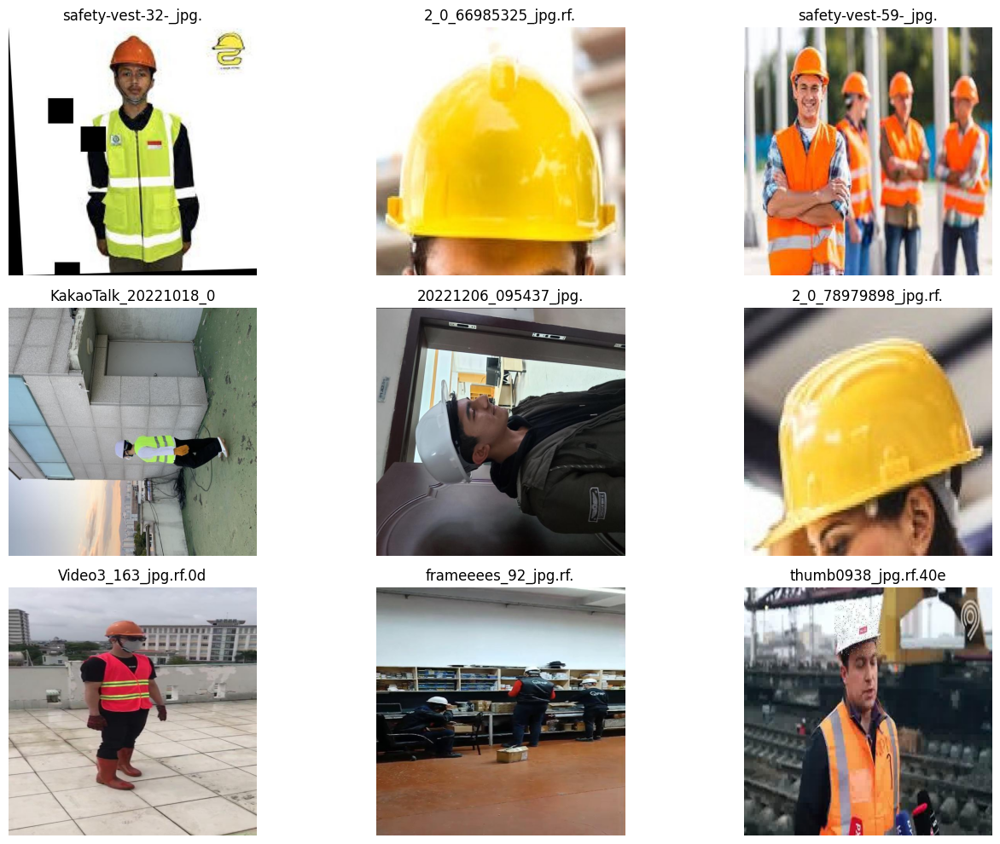

In [17]:
import os
import cv2
import random
import matplotlib.pyplot as plt

ruta = "Safety-Helmet-1/test/images"

imagenes = random.sample(os.listdir(ruta), 9)

plt.figure(figsize=(14,10))

for i, archivo in enumerate(imagenes):

    img = cv2.imread(os.path.join(ruta, archivo))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.title(archivo[:20])
    plt.axis("off")

plt.tight_layout()
plt.show()

In [19]:
import os

for root, dirs, files in os.walk("/content"):
    if "best.pt" in files:
        print("Encontrado:", os.path.join(root, "best.pt"))

Encontrado: /content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt


**Evaluación del modelo sobre el conjunto de prueba**

In [20]:
from ultralytics import YOLO
import pandas as pd

print("="*60)
print("EVALUACIÓN DEL MODELO SOBRE EL CONJUNTO TEST")
print("="*60)

# Cargar mejor modelo obtenido durante el entrenamiento
modelo = YOLO(
    "/content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt"
)

# Evaluar sobre TEST
metricas_test = modelo.val(
    data="Safety-Helmet-1/data.yaml",
    split="test"
)

print("\nEvaluación finalizada.")

EVALUACIÓN DEL MODELO SOBRE EL CONJUNTO TEST
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 893.2±367.7 MB/s, size: 43.8 KB)
val: Scanning /content/Safety-Helmet-1/test/labels... 107 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 107/107 1.8Kit/s 0.1s
val: New cache created: /content/Safety-Helmet-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        107        198      0.891      0.854      0.837      0.519
                Helmet         87        136      0.945      0.934      0.945      0.644
             No Helmet         23         62      0.837      0.774       0.73      0.395
Speed: 3.2ms preprocess, 5.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /content/runs/detec

Se evalúa el mejor modelo obtenido durante el entrenamiento utilizando el conjunto de prueba (test), el cual contiene imágenes que no fueron utilizadas ni para entrenar ni para validar el detector. Esta evaluación permite estimar el desempeño real del sistema ante datos completamente nuevos.

**Tabla de métricas obtenidas en TEST**

In [21]:
# @title
import pandas as pd

print("""
RESUMEN DE MÉTRICAS DEL CONJUNTO DE PRUEBA (TEST)

Se muestran las métricas obtenidas por el modelo YOLOv8n
sobre imágenes no utilizadas durante entrenamiento ni validación.
""")

metricas = {
    "Clase": ["Helmet", "No Helmet", "Global"],
    "Precision": [0.945, 0.837, 0.891],
    "Recall": [0.934, 0.774, 0.854],
    "mAP@0.5": [0.945, 0.730, 0.837],
    "mAP@0.5:0.95": [0.644, 0.395, 0.519]
}

df_metricas = pd.DataFrame(metricas)

display(df_metricas)


RESUMEN DE MÉTRICAS DEL CONJUNTO DE PRUEBA (TEST)

Se muestran las métricas obtenidas por el modelo YOLOv8n
sobre imágenes no utilizadas durante entrenamiento ni validación.



,Clase,Precision,Recall,mAP@0.5,mAP@0.5:0.95
0,Helmet,0.945,0.934,0.945,0.644
1,No Helmet,0.837,0.774,0.730,0.395
2,Global,0.891,0.854,0.837,0.519


**Interpretación de resultados**

El modelo obtuvo un mAP@0.5 global de 0.837 y un mAP@0.5:0.95 de 0.519 sobre el conjunto de prueba.

La clase Helmet presentó el mejor desempeño, alcanzando un mAP@0.5 de 0.945, mientras que la clase No Helmet obtuvo un mAP@0.5 de 0.730.

La diferencia observada puede estar relacionada con el desbalance existente en el conjunto de datos, donde la cantidad de ejemplos de trabajadores con casco es considerablemente superior a la de trabajadores sin casco.

# Análisis de robustez ante oclusión

Se evalúa el comportamiento del detector YOLOv8 frente a distintos niveles de oclusión presentes en el conjunto de prueba.

Las imágenes fueron clasificadas manualmente en tres categorías:

- Baja oclusión: el casco es completamente visible.
- Media oclusión: parte del casco o del trabajador se encuentra parcialmente oculto.
- Alta oclusión: gran parte del casco o del trabajador se encuentra oculta.

Posteriormente se analiza el desempeño visual del detector en cada grupo.


ANÁLISIS DE OCLUSIÓN

Se muestran ejemplos de detección sobre imágenes del conjunto
de prueba para identificar diferentes niveles de oclusión.



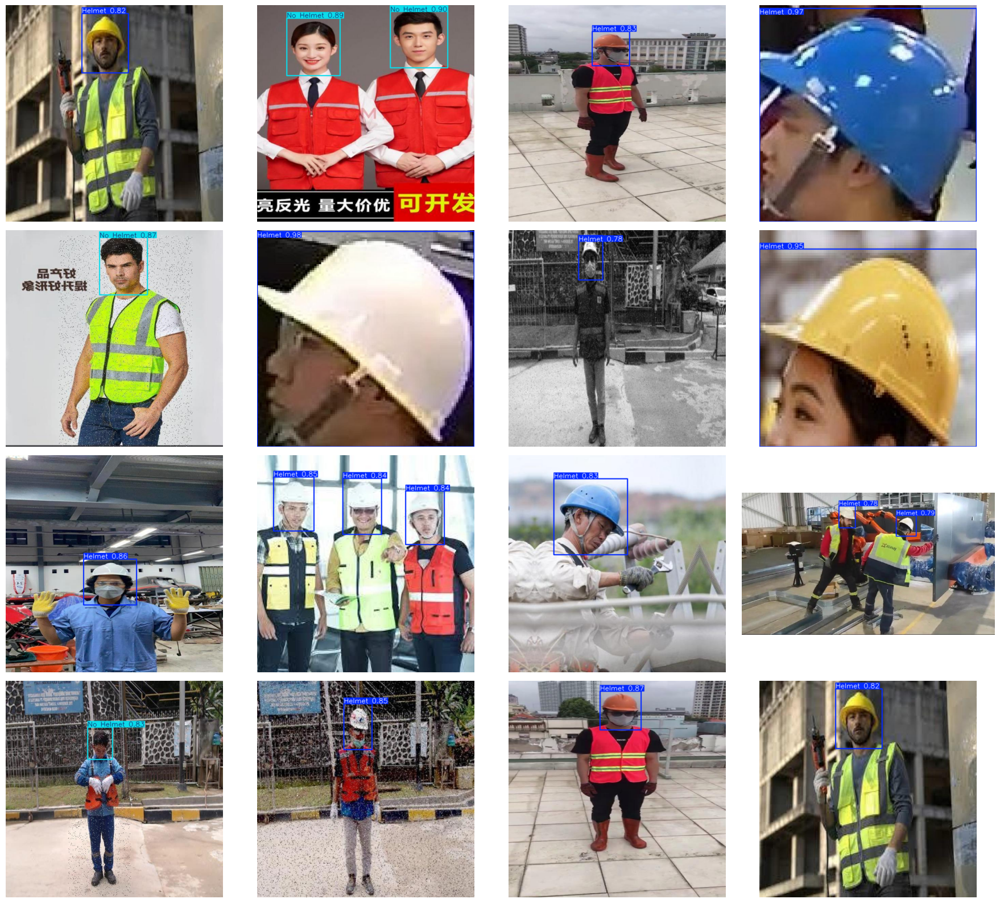

In [22]:
from ultralytics import YOLO
import os
import random
import cv2
import matplotlib.pyplot as plt

print("""
ANÁLISIS DE OCLUSIÓN

Se muestran ejemplos de detección sobre imágenes del conjunto
de prueba para identificar diferentes niveles de oclusión.
""")

modelo = YOLO(
    "/content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt"
)

ruta_test = "Safety-Helmet-1/test/images"

imagenes = random.sample(
    os.listdir(ruta_test),
    min(20, len(os.listdir(ruta_test)))
)

plt.figure(figsize=(18,16))

for i, archivo in enumerate(imagenes[:16]):

    resultado = modelo.predict(
        os.path.join(ruta_test, archivo),
        conf=0.25,
        verbose=False
    )

    img = resultado[0].plot()

    plt.subplot(4,4,i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [23]:
# @title
from ultralytics import YOLO
import os

print("""
GENERACIÓN DE PREDICCIONES SOBRE TODO EL CONJUNTO TEST

Las imágenes generadas serán utilizadas para el análisis
de robustez ante oclusión solicitado en el trabajo.
""")

modelo = YOLO(
    "/content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt"
)

modelo.predict(
    source="Safety-Helmet-1/test/images",
    conf=0.25,
    save=True,
    project="occlusion_analysis",
    name="predicciones_test"
)

print("Predicciones generadas correctamente.")


GENERACIÓN DE PREDICCIONES SOBRE TODO EL CONJUNTO TEST

Las imágenes generadas serán utilizadas para el análisis
de robustez ante oclusión solicitado en el trabajo.


image 1/107 /content/Safety-Helmet-1/test/images/00236_jpg.rf.93adcd4b4bd1780f8419bcdcf77536a3.jpg: 640x640 1 No Helmet, 14.8ms
image 2/107 /content/Safety-Helmet-1/test/images/005302_jpg.rf.8dc1867edda29b40310ac341afaf0eed.jpg: 640x640 1 Helmet, 10.7ms
image 3/107 /content/Safety-Helmet-1/test/images/005314_jpg.rf.755451d5650add042282cc807c1151ab.jpg: 640x640 3 Helmets, 9.7ms
image 4/107 /content/Safety-Helmet-1/test/images/005323_jpg.rf.858d6a23baf1b5fe18355d533b020106.jpg: 640x640 3 Helmets, 10.7ms
image 5/107 /content/Safety-Helmet-1/test/images/006070_jpg.rf.16a53ab2d49aa9f13bf2edbab5844784.jpg: 640x640 3 Helmets, 10.5ms
image 6/107 /content/Safety-Helmet-1/test/images/006167_jpg.rf.adf702f6c76d00fc75ea216cf4b75e7e.jpg: 640x640 1 Helmet, 9.9ms
image 7/107 /content/Safety-Helmet-1/test/images/006239_jpg.rf.d68a74e887

In [25]:
import os

for root, dirs, files in os.walk("/content"):
    if "predicciones_test" in root:
        print(root)

/content/runs/detect/occlusion_analysis/predicciones_test


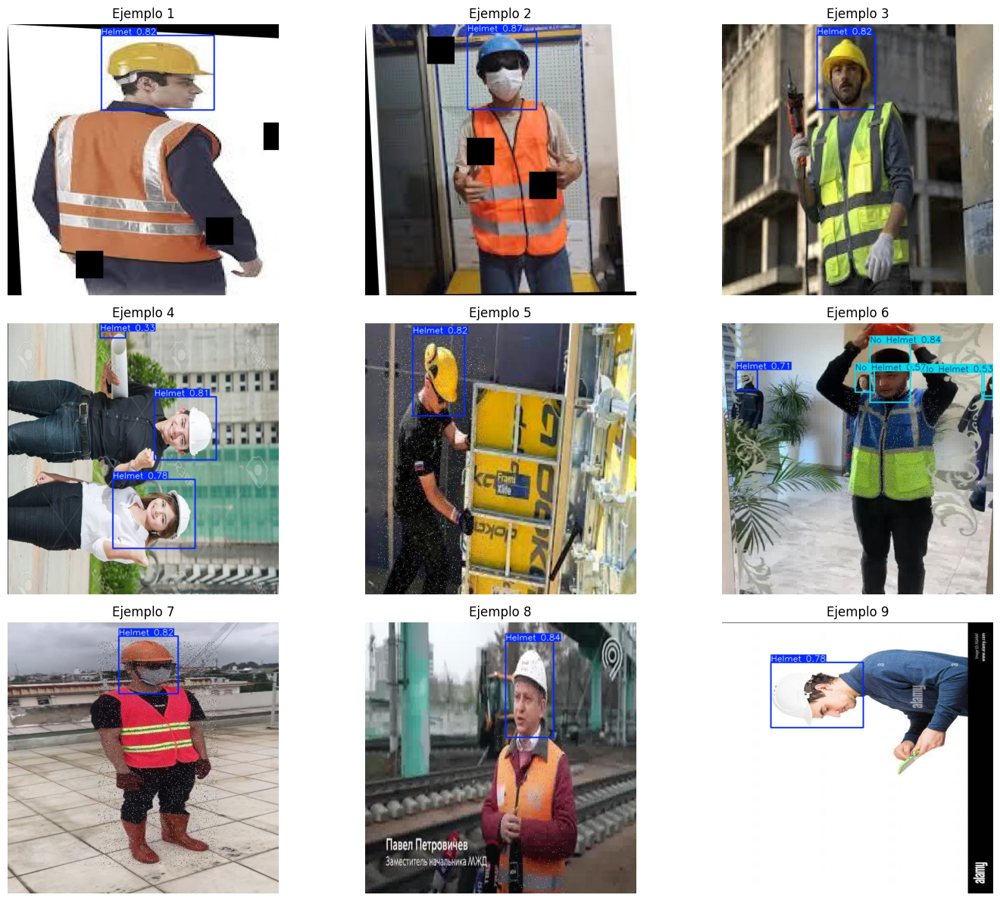

In [26]:
# @title
"""
Esta sección muestra imágenes del conjunto de prueba procesadas por YOLO.
El objetivo es inspeccionar visualmente si el modelo detecta correctamente
los cascos cuando existen distintos niveles de oclusión.

Posteriormente estas observaciones se utilizarán para clasificar ejemplos
en oclusión baja, media y alta.
"""

import os
import cv2
import random
import matplotlib.pyplot as plt

ruta = "/content/runs/detect/occlusion_analysis/predicciones_test"

imagenes = random.sample(os.listdir(ruta), 9)

plt.figure(figsize=(15,12))

for i, archivo in enumerate(imagenes):

    img = cv2.imread(os.path.join(ruta, archivo))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Ejemplo {i+1}")

plt.tight_layout()
plt.show()

In [27]:
# @title
"""
Se clasifican ejemplos del conjunto de prueba en tres niveles
de oclusión utilizando como criterio aproximado el tamaño de
la detección generada por YOLO.

- Oclusión baja  : casco claramente visible
- Oclusión media : casco parcialmente visible
- Oclusión alta  : casco pequeño o parcialmente oculto
"""

from ultralytics import YOLO
import os
import cv2
import matplotlib.pyplot as plt

modelo = YOLO(
    "/content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt"
)

ruta_test = "Safety-Helmet-1/test/images"

baja = []
media = []
alta = []

for archivo in os.listdir(ruta_test):

    ruta = os.path.join(ruta_test, archivo)

    resultado = modelo.predict(
        ruta,
        conf=0.25,
        verbose=False
    )

    if len(resultado[0].boxes) == 0:
        continue

    box = resultado[0].boxes.xyxy[0].cpu().numpy()

    ancho = box[2] - box[0]
    alto = box[3] - box[1]

    area = ancho * alto

    if area > 15000:
        baja.append(ruta)

    elif area > 5000:
        media.append(ruta)

    else:
        alta.append(ruta)

print("Oclusión baja :", len(baja))
print("Oclusión media:", len(media))
print("Oclusión alta :", len(alta))

Oclusión baja : 73
Oclusión media: 24
Oclusión alta : 9


**Visualización de ejemplos con oclusión**

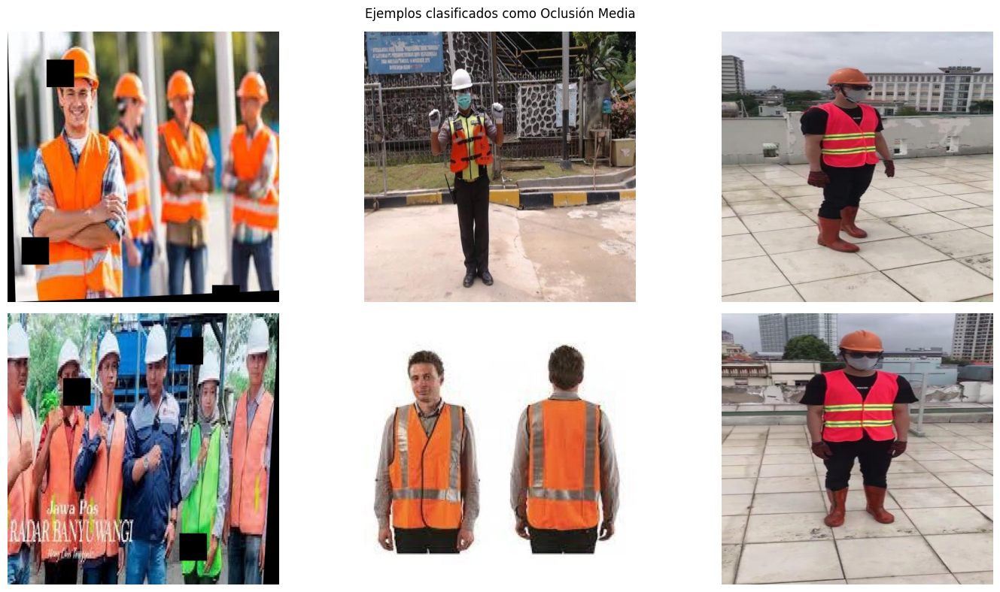

In [29]:
# @title
plt.figure(figsize=(15,8))

for i, ruta in enumerate(media[:6]):

    img = cv2.imread(ruta)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.suptitle("Ejemplos clasificados como Oclusión Media")
plt.tight_layout()
plt.show()

**Generación de una muestra amplia para clasificación manual de oclusión**


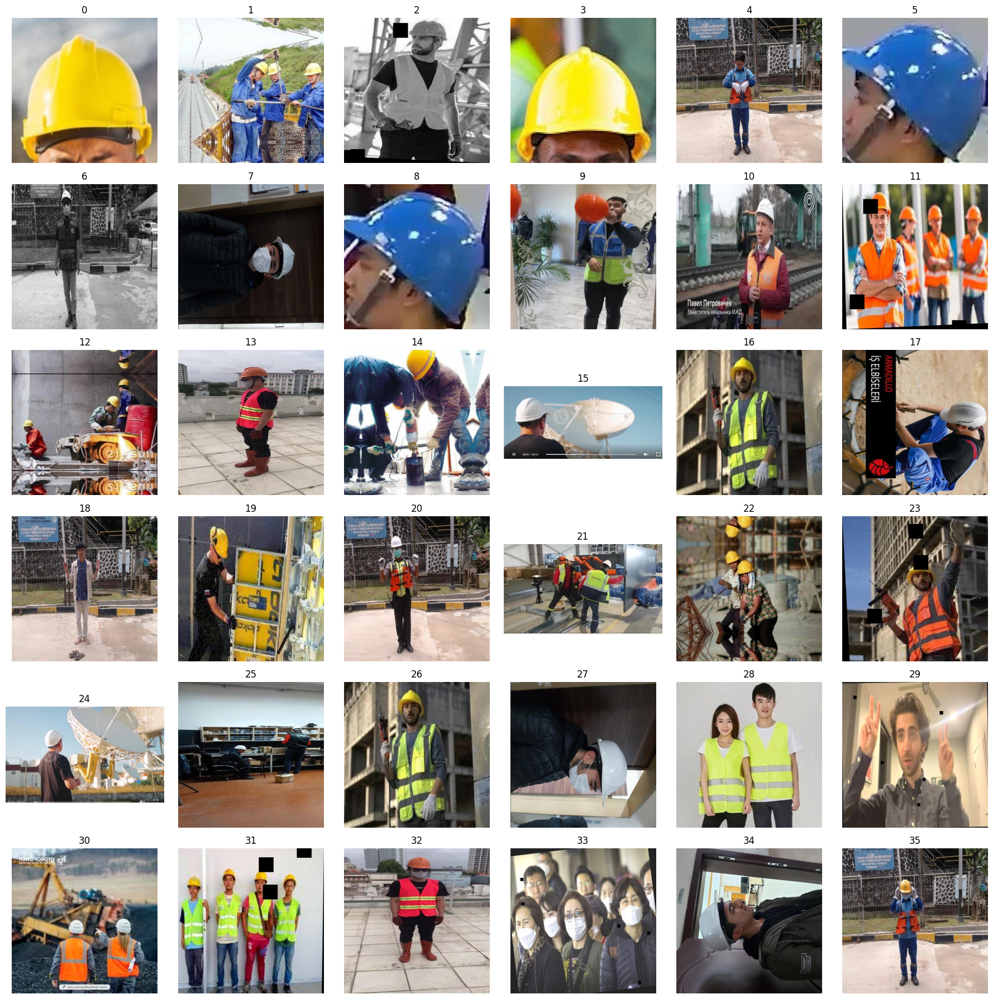

In [31]:
"""
Se visualiza una muestra amplia de imágenes del conjunto de prueba.

El objetivo es identificar manualmente ejemplos de:
- Oclusión baja
- Oclusión media
- Oclusión alta

Posteriormente se construirán grupos separados para evaluar
la robustez del detector frente a distintos niveles de oclusión.
"""

import os
import random
import cv2
import matplotlib.pyplot as plt

ruta_test = "Safety-Helmet-1/test/images"

imagenes = random.sample(os.listdir(ruta_test), 36)

plt.figure(figsize=(18,18))

for i, archivo in enumerate(imagenes):

    img = cv2.imread(os.path.join(ruta_test, archivo))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(6,6,i+1)
    plt.imshow(img)
    plt.title(str(i))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [33]:
import pandas as pd

df_oclusion = pd.DataFrame({
    "Nivel de oclusión": ["Baja", "Media", "Alta"],
    "Cantidad de imágenes": [19, 8, 5]
})

display(
    df_oclusion.style
    .hide(axis="index")
    .set_caption("Clasificación manual de oclusión en imágenes del conjunto de prueba")
)

Nivel de oclusión,Cantidad de imágenes
Baja,19
Media,8
Alta,5


In [34]:
# Conclusión:
# La mayoría de imágenes presentan oclusión baja.
# Se identificaron pocos casos de oclusión alta,
# por lo que la evaluación de robustez bajo ocultamiento severo
# está limitada por la distribución del conjunto de prueba.

**Verificador de cumplimiento**


VERIFICADOR DE CUMPLIMIENTO

Regla:
- Helmet -> Cumple
- No Helmet -> Incumple



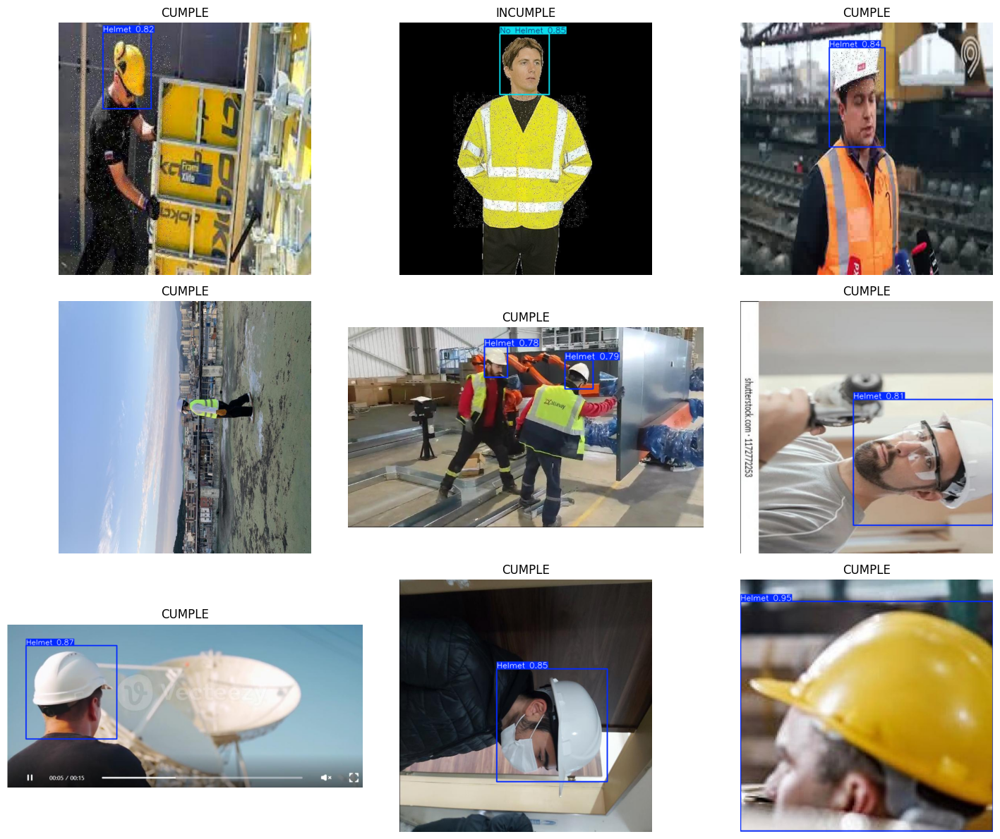

In [35]:
# @title
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os
import random

print("""
VERIFICADOR DE CUMPLIMIENTO

Regla:
- Helmet -> Cumple
- No Helmet -> Incumple
""")

modelo = YOLO(
    "/content/runs/detect/helmet_detection/yolov8n_experimento/weights/best.pt"
)

ruta_test = "Safety-Helmet-1/test/images"

imagenes = random.sample(os.listdir(ruta_test), 9)

plt.figure(figsize=(15,12))

for i, archivo in enumerate(imagenes):

    ruta = os.path.join(ruta_test, archivo)

    resultado = modelo.predict(
        ruta,
        conf=0.25,
        verbose=False
    )

    clases = resultado[0].boxes.cls.cpu().numpy()

    cumple = True

    for c in clases:
        nombre = resultado[0].names[int(c)]

        if nombre == "No Helmet":
            cumple = False

    img = resultado[0].plot()

    estado = "CUMPLE" if cumple else "INCUMPLE"

    plt.subplot(3,3,i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(estado)
    plt.axis("off")

plt.tight_layout()
plt.show()

**Interpretación de los resultados del verificador de cumplimiento**

Se observa que el sistema es capaz de identificar correctamente trabajadores que utilizan casco de seguridad y diferenciarlos de aquellos que no cumplen con esta condición.

Las imágenes etiquetadas como CUMPLE corresponden a escenas donde el modelo detectó únicamente la clase Helmet, indicando que los trabajadores observados portan casco de seguridad. Por otro lado, las imágenes clasificadas como INCUMPLE contienen al menos una detección de la clase No Helmet, activando la regla de incumplimiento establecida.

También se aprecia que el detector mantiene un comportamiento adecuado en diferentes escenarios, incluyendo variaciones de iluminación, orientación de la cabeza, distancia a la cámara y presencia de múltiples trabajadores. Sin embargo, algunas imágenes presentan recortes parciales, inclinaciones u oclusiones que podrían afectar la precisión de las detecciones en situaciones más complejas.

En general, los resultados obtenidos demuestran que el sistema puede utilizarse como un mecanismo automático de monitoreo para verificar el uso de equipos de protección personal en entornos industriales y de construcción.

**Implicaciones Éticas del Sistema de Detección de Uso de Casco**

Los sistemas de visión por computadora aplicados a la seguridad ocupacional pueden contribuir significativamente a la prevención de accidentes mediante la supervisión automática del uso de equipos de protección personal. Sin embargo, su implementación también plantea importantes consideraciones éticas relacionadas con la precisión del sistema, la privacidad de los trabajadores y los posibles sesgos presentes en los datos utilizados para el entrenamiento.

Uno de los aspectos más relevantes es el equilibrio entre falsos positivos y falsos negativos. Un falso positivo ocurre cuando el sistema indica incorrectamente que un trabajador incumple las normas de seguridad, aun cuando utiliza correctamente el casco. Este tipo de error puede generar interrupciones innecesarias, alertas injustificadas y pérdida de confianza en la herramienta. Por otro lado, un falso negativo ocurre cuando el sistema no detecta a un trabajador que realmente no utiliza casco. Este escenario representa un riesgo mayor, ya que puede permitir que situaciones peligrosas pasen desapercibidas y comprometan la seguridad de los trabajadores.

Otro aspecto importante es la privacidad. La utilización de cámaras para monitorear el cumplimiento de normas de seguridad implica la captura continua de imágenes de los trabajadores durante sus actividades laborales. Aunque el objetivo principal es proteger la integridad física del personal, es necesario garantizar que la información recopilada sea utilizada exclusivamente para fines de seguridad. Asimismo, las organizaciones deben informar adecuadamente a los trabajadores sobre el funcionamiento del sistema, las condiciones de almacenamiento de los datos y las medidas implementadas para proteger su privacidad.

También deben considerarse los posibles sesgos presentes en el conjunto de entrenamiento. El análisis exploratorio realizado mostró una distribución desigual entre las clases Helmet y No Helmet, con una mayor cantidad de ejemplos pertenecientes a la clase Helmet. Esta diferencia puede influir en el desempeño del modelo, favoreciendo la detección de la clase más representada. Además, la diversidad limitada de escenarios, condiciones de iluminación, ángulos de captura o características físicas de las personas podría afectar la capacidad de generalización del sistema cuando se utilice en entornos diferentes a los observados durante el entrenamiento.

Finalmente, los sistemas de detección automática no deben considerarse un reemplazo completo de la supervisión humana. Su función principal es servir como una herramienta de apoyo para mejorar los procesos de monitoreo y prevención de riesgos laborales. Las decisiones relacionadas con sanciones, evaluaciones de desempeño o acciones disciplinarias deberían incluir siempre una revisión humana que permita validar las alertas generadas por el sistema y evitar posibles injusticias derivadas de errores de clasificación.